In [4]:
import os
import numpy as np
import torch
import torchvision.transforms as transforms
from torchvision.utils import make_grid
from torch import nn, optim
from matplotlib import pyplot as plt
import seaborn as sns

In [19]:
pip install torchviz

  Preparing metadata (setup.py) ... done
  Created wheel for torchviz: filename=torchviz-0.0.2-py3-none-any.whl size=4150 sha256=ed9adfd1d5a017a32870917b988a3a7222a2febacd407f1cf4f48cae25540b18
  Stored in directory: /root/.cache/pip/wheels/04/38/f5/dc4f85c3909051823df49901e72015d2d750bd26b086480ec2
Successfully built torchviz
Note: you may need to restart the kernel to use updated packages.


In [6]:
device = 'cuda' if torch.cuda.is_available() else 'cpu'


In [7]:
path = '../input/pokemon-images-dataset/pokemon'


In [8]:
norm=((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))
batch_size = 64
image_size = 64

In [9]:
transf = transforms.Compose([
    transforms.Resize(image_size),
    transforms.CenterCrop(image_size),
    transforms.ToTensor(),
    transforms.Normalize(*norm,inplace=True),
])

In [10]:
from torchvision import datasets

dataset = datasets.ImageFolder(root=path,transform=transf)
dataloader = torch.utils.data.DataLoader(dataset, batch_size=batch_size, shuffle=True, num_workers=2)

In [11]:
def unnorm(images, means, stds):
    means = torch.tensor(means).reshape(1,3,1,1)
    stds = torch.tensor(stds).reshape(1,3,1,1)
    return images*stds+means

In [12]:
def show_batch(data_loader):
    for images, labels in data_loader:
        fig, ax = plt.subplots(figsize=(15, 15))
        ax.set_xticks([]); ax.set_yticks([])
        unnorm_images = unnorm(images, *norm)
        ax.imshow(make_grid(unnorm_images[:batch_size], nrow=8).permute(1, 2, 0).clamp(0,1))
        break

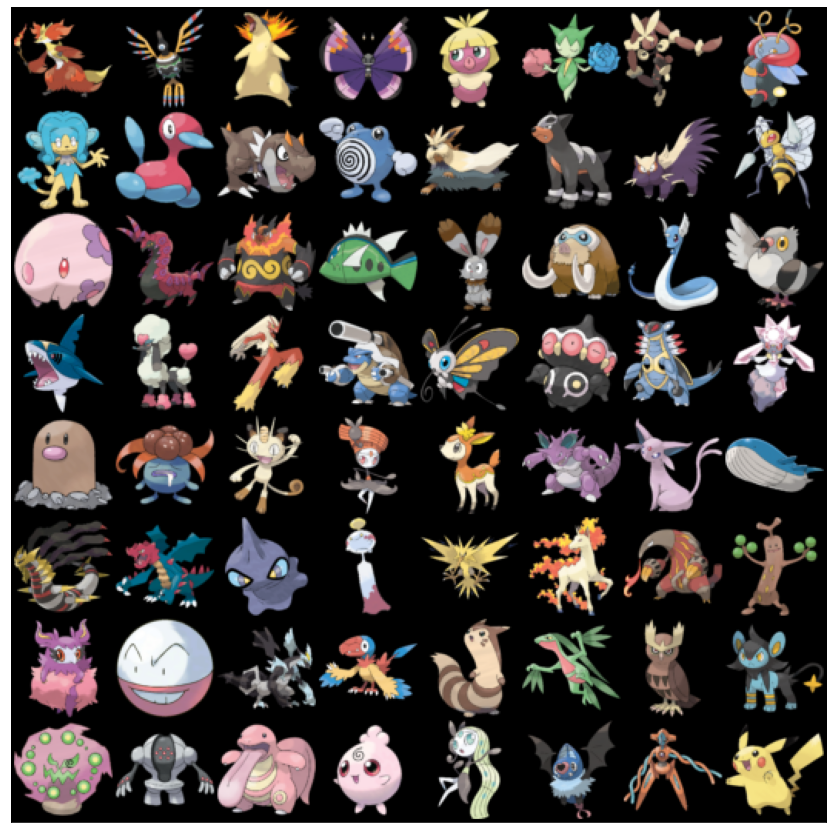

In [13]:
show_batch(dataloader)

In [14]:
def weights_init(m):
    classname = m.__class__.__name__
    if classname.find('Conv') != -1:
        nn.init.normal_(m.weight.data, 0.0, 0.02)
    elif classname.find('BatchNorm') != -1:
        nn.init.normal_(m.weight.data, 1.0, 0.02)
        nn.init.constant_(m.bias.data, 0)

# Generator

In [25]:
class Generator(nn.Module):
    def __init__(self):
        super(Generator, self).__init__()
        self.conv_transpose1 = nn.ConvTranspose2d(100, 512, kernel_size=4, stride=1, padding=0, bias=False)
        self.bn1 = nn.BatchNorm2d(512)
        self.relu1 = nn.ReLU(True)
        self.conv_transpose2 = nn.ConvTranspose2d(512, 256, kernel_size=4, stride=2, padding=1, bias=False)
        self.bn2 = nn.BatchNorm2d(256)
        self.relu2 = nn.ReLU(True)
        self.conv_transpose3 = nn.ConvTranspose2d(256, 128, kernel_size=4, stride=2, padding=1, bias=False)
        self.bn3 = nn.BatchNorm2d(128)
        self.relu3 = nn.ReLU(True)
        self.conv_transpose4 = nn.ConvTranspose2d(128, 64, kernel_size=4, stride=2, padding=1, bias=False)
        self.bn4 = nn.BatchNorm2d(64)
        self.relu4 = nn.ReLU(True)
        self.conv_transpose5 = nn.ConvTranspose2d(64, 3, kernel_size=4, stride=2, padding=1, bias=False)
        self.tanh = nn.Tanh()

    def forward(self, input):
        x = self.relu1(self.bn1(self.conv_transpose1(input)))
        x = self.relu2(self.bn2(self.conv_transpose2(x)))
        x = self.relu3(self.bn3(self.conv_transpose3(x)))
        x = self.relu4(self.bn4(self.conv_transpose4(x)))
        x = self.tanh(self.conv_transpose5(x))
        return x

# Discriminator

In [26]:
class Discriminator(nn.Module):
    def __init__(self):
        super(Discriminator, self).__init__()
        self.conv1 = nn.Conv2d(3, 64, kernel_size=4, stride=2, padding=1, bias=False)
        self.conv2 = nn.Conv2d(64, 64 * 2, kernel_size=4, stride=2, padding=1, bias=False)
        self.bn2 = nn.BatchNorm2d(64 * 2)
        self.conv3 = nn.Conv2d(64 * 2, 64 * 4, kernel_size=4, stride=2, padding=1, bias=False)
        self.bn3 = nn.BatchNorm2d(64 * 4)
        self.conv4 = nn.Conv2d(64 * 4, 64 * 8, kernel_size=4, stride=2, padding=1, bias=False)
        self.bn4 = nn.BatchNorm2d(64 * 8)
        self.conv5 = nn.Conv2d(64 * 8, 1, kernel_size=4, stride=1, padding=0, bias=False)
        self.sigmoid = nn.Sigmoid()
        self.leaky_relu = nn.LeakyReLU(0.2, inplace=True)

    def forward(self, input):
        x = self.leaky_relu(self.conv1(input))
        x = self.leaky_relu(self.bn2(self.conv2(x)))
        x = self.leaky_relu(self.bn3(self.conv3(x)))
        x = self.leaky_relu(self.bn4(self.conv4(x)))
        x = self.conv5(x)
        x = self.sigmoid(x)
        return x

In [28]:
generator = Generator()
generator.to(device)
generator.apply(weights_init)

Generator(
  (conv_transpose1): ConvTranspose2d(100, 512, kernel_size=(4, 4), stride=(1, 1), bias=False)
  (bn1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu1): ReLU(inplace=True)
  (conv_transpose2): ConvTranspose2d(512, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
  (bn2): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu2): ReLU(inplace=True)
  (conv_transpose3): ConvTranspose2d(256, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
  (bn3): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu3): ReLU(inplace=True)
  (conv_transpose4): ConvTranspose2d(128, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
  (bn4): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu4): ReLU(inplace=True)
  (conv_transpose5): ConvTranspose2d(64, 3, kernel_size=(4, 4), stride=(2, 2), padding=

In [20]:
from torchviz import make_dot

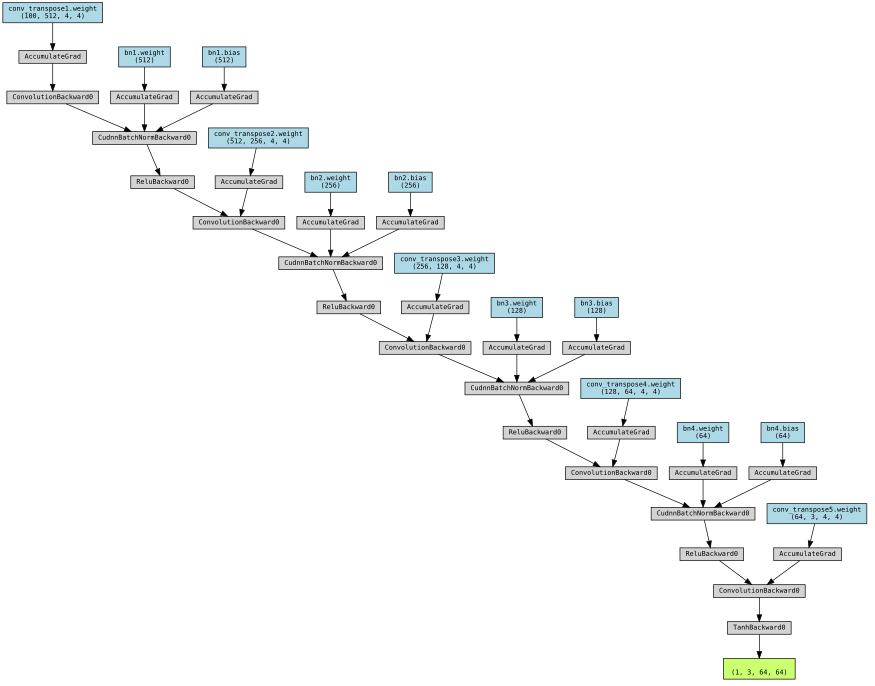

In [21]:
dummy_input = torch.randn(1, 100, 1, 1,device=device)
dot = make_dot(generator(dummy_input), params=dict(generator.named_parameters()))
dot

In [22]:
discriminator = Discriminator()
discriminator.to(device)
discriminator.apply(weights_init)

Discriminator(
  (conv1): Conv2d(3, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
  (conv2): Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
  (bn2): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (conv3): Conv2d(128, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
  (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (conv4): Conv2d(256, 512, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
  (bn4): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (conv5): Conv2d(512, 1, kernel_size=(4, 4), stride=(1, 1), bias=False)
  (sigmoid): Sigmoid()
  (leaky_relu): LeakyReLU(negative_slope=0.2, inplace=True)
)

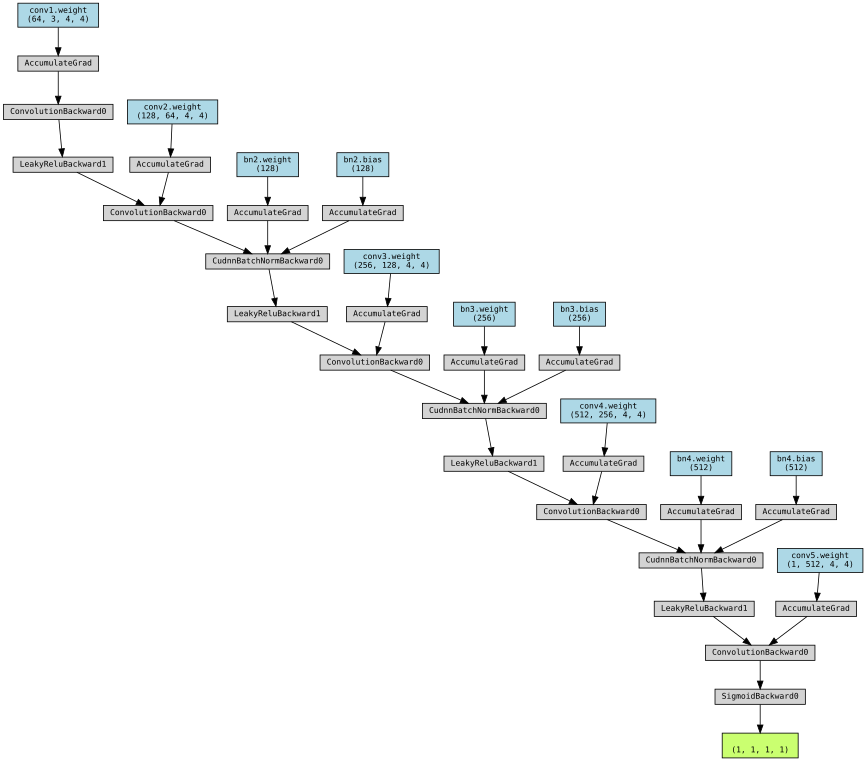

In [23]:
dummy_input = torch.randn(1, 3, 64, 64, device=device)
dot = make_dot(discriminator(dummy_input), params=dict(discriminator.named_parameters()))
dot

In [ ]:
criterion = nn.BCELoss()
fixed_noise = torch.randn(64, 100, 1, 1, device=device)

real_label = 1
fake_label = 0

optimizerD = optim.Adam(discriminator.parameters(), lr=0.0002, betas=(0.5, 0.999))
optimizerG = optim.Adam(generator.parameters(), lr=0.0002, betas=(0.5, 0.999))

# Training

Epoch [50/600], Generator Loss: 4.4430, Discriminator Loss: 0.7086


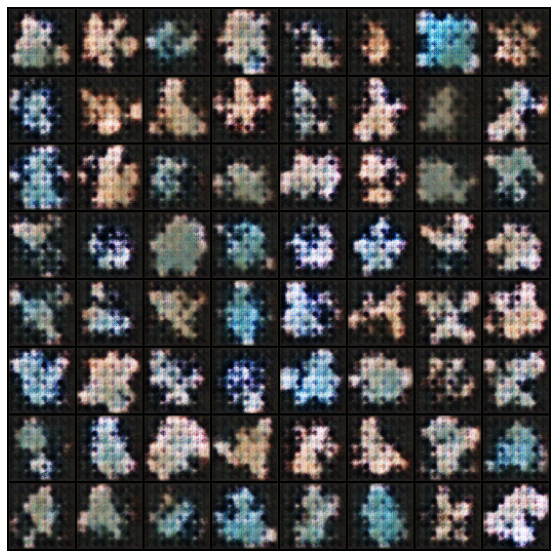

Epoch [100/600], Generator Loss: 3.2833, Discriminator Loss: 0.3227


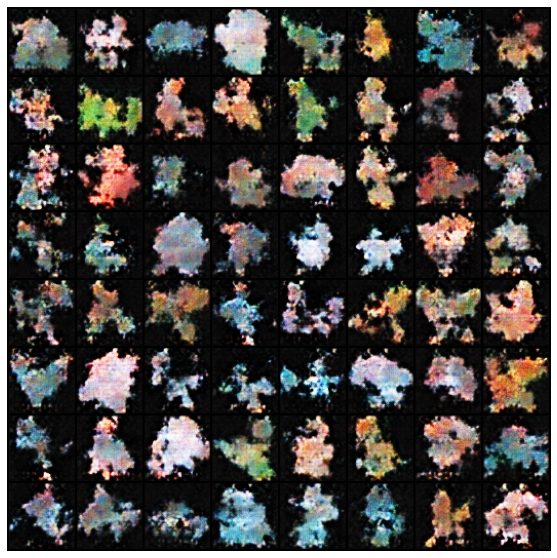

Epoch [150/600], Generator Loss: 3.8949, Discriminator Loss: 0.1165


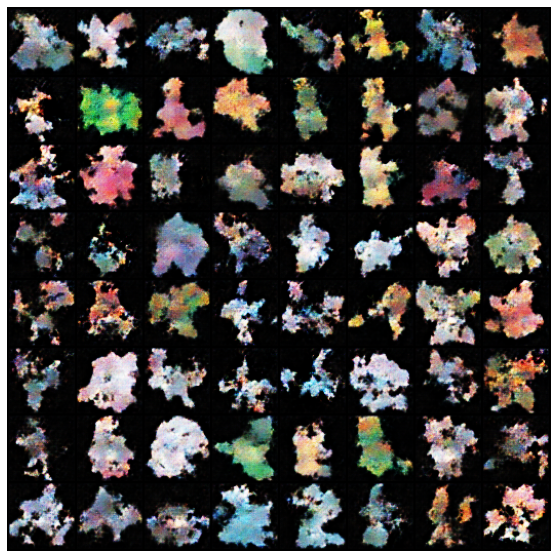

Epoch [200/600], Generator Loss: 4.2400, Discriminator Loss: 0.0749


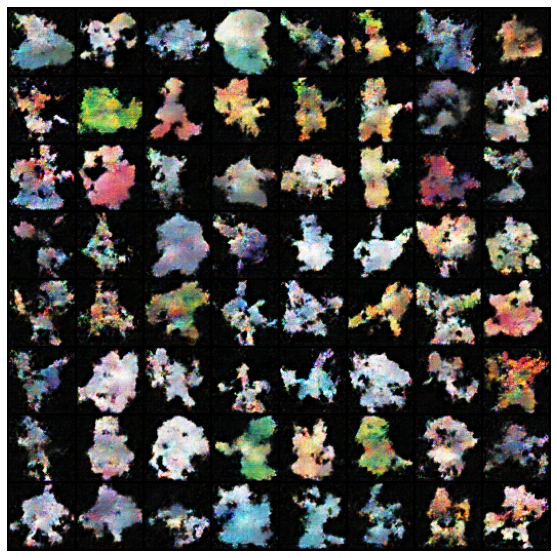

Epoch [250/600], Generator Loss: 1.6035, Discriminator Loss: 1.3564


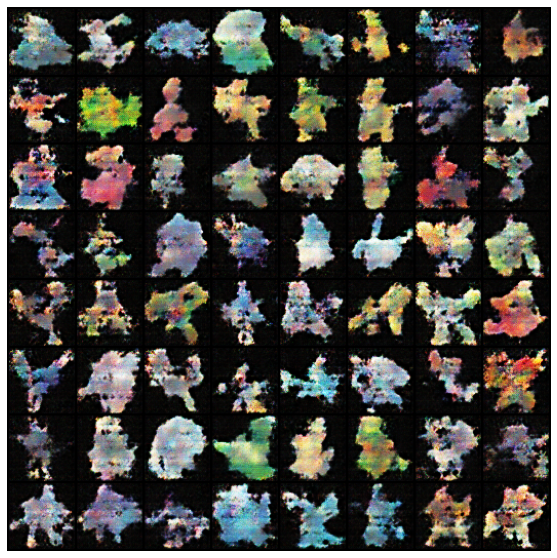

Epoch [300/600], Generator Loss: 2.2829, Discriminator Loss: 1.0451


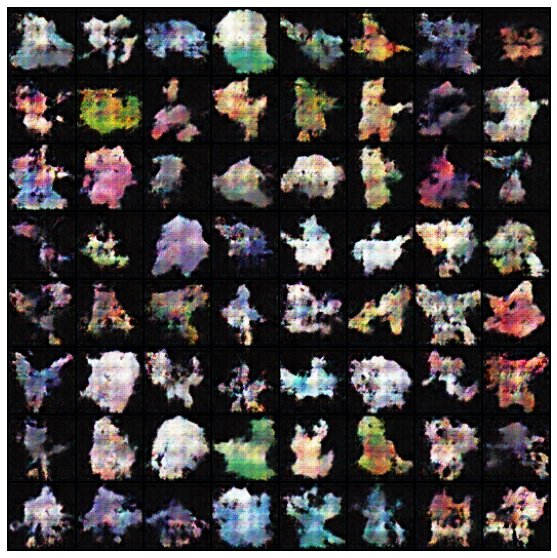

Epoch [350/600], Generator Loss: 5.1287, Discriminator Loss: 0.0295


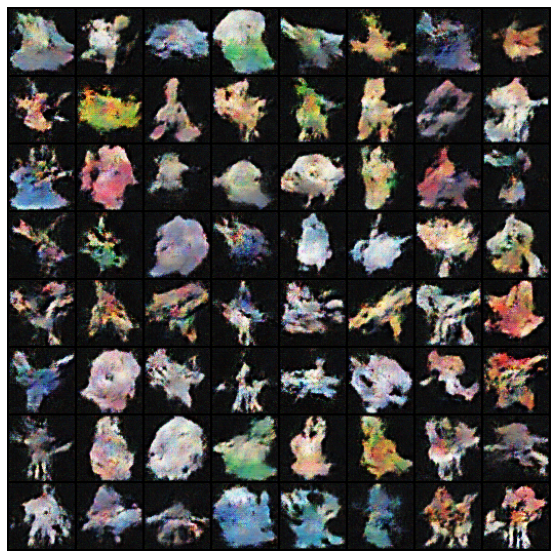

Epoch [400/600], Generator Loss: 5.7970, Discriminator Loss: 0.0123


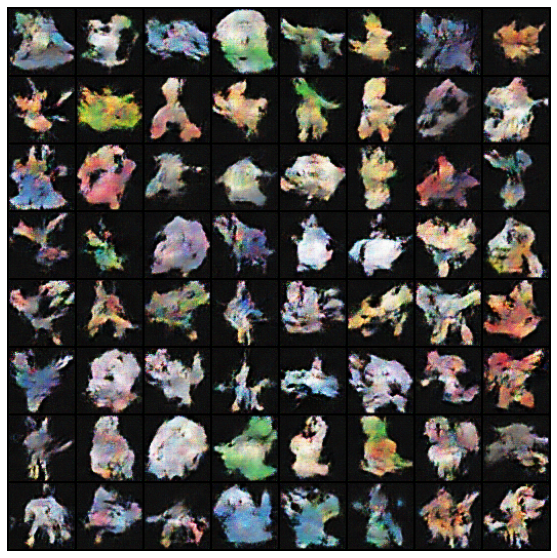

Epoch [450/600], Generator Loss: 6.2327, Discriminator Loss: 0.2355


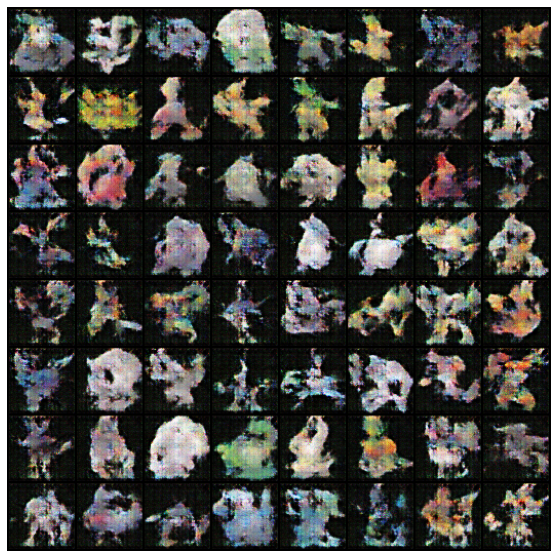

Epoch [500/600], Generator Loss: 58.9312, Discriminator Loss: 0.0000


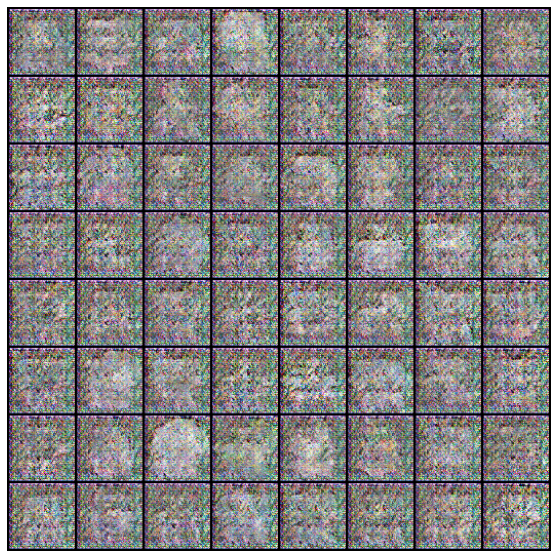

Epoch [550/600], Generator Loss: 58.9820, Discriminator Loss: 0.0000


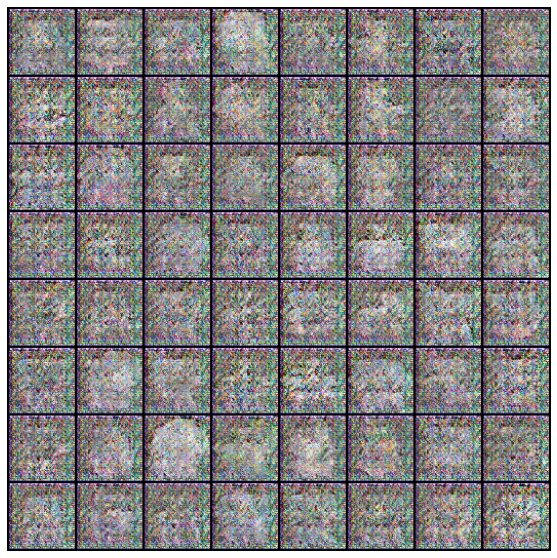

Epoch [600/600], Generator Loss: 58.9692, Discriminator Loss: 0.0000


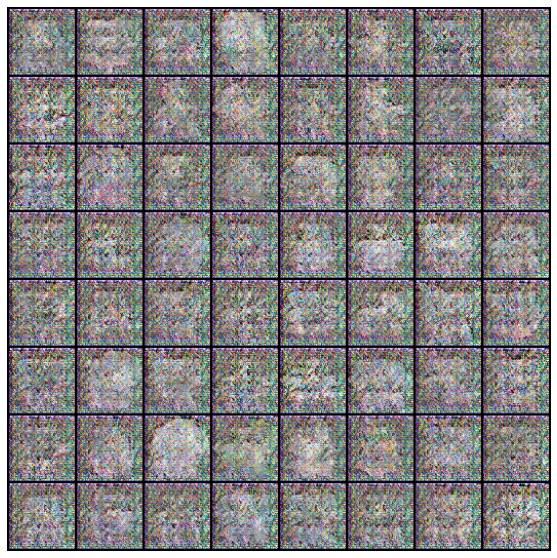

Finished Training


In [20]:
import torchvision.utils as vutils

G_losses, D_losses = [], []
img_list = []
num_epochs = 600

for epoch in range(num_epochs):
    epoch_G_loss = 0.0
    epoch_D_loss = 0.0
    
    for i, data in enumerate(dataloader, 0):
        real_images = data[0].to(device)
        b_size = real_images.size(0)
        
        # Tạo nhãn cho ảnh thật và Fake
        real_labels = torch.full((b_size,), real_label, dtype=torch.float, device=device)
        fake_labels = torch.full((b_size,), fake_label, dtype=torch.float, device=device)
        
        optimizerD.zero_grad()
        optimizerG.zero_grad()
        
        # Discriminator loss
        output_real = discriminator(real_images).view(-1)
        errD_real = criterion(output_real, real_labels)
        errD_real.backward()
        D_x = output_real.mean().item()
        
        # Tạo ảnh fake
        noise = torch.randn(b_size, 100, 1, 1, device=device)
        fake_images = generator(noise)
        
        # Discriminator loss cho ảnh fake
        output_fake = discriminator(fake_images.detach()).view(-1)
        errD_fake = criterion(output_fake, fake_labels)
        errD_fake.backward()
        D_G_z1 = output_fake.mean().item()
        
        # Update discriminator parameters
        optimizerD.step()
        
        # Generator loss
        output = discriminator(fake_images).view(-1)
        errG = criterion(output, real_labels)
        errG.backward()
        D_G_z2 = output.mean().item()
        
        # Update generator parameters
        optimizerG.step()
        
        # Accumulate losses for this batch
        epoch_D_loss += errD_real.item() + errD_fake.item()
        epoch_G_loss += errG.item()
    
    # Calculate average losses for this epoch
    avg_D_loss = epoch_D_loss / len(dataloader)
    avg_G_loss = epoch_G_loss / len(dataloader)
    
    # Store losses
    G_losses.append(avg_G_loss)
    D_losses.append(avg_D_loss)
    
    # Generate and store a grid of fake images every 50 epochs
    if (epoch + 1) % 50 == 0:
        print(f'Epoch [{epoch+1}/{num_epochs}], Generator Loss: {avg_G_loss:.4f}, Discriminator Loss: {avg_D_loss:.4f}')
        
        with torch.no_grad():
            fake_images = generator(fixed_noise).detach().cpu()
        img_list.append(vutils.make_grid(fake_images, padding=2, normalize=True))
        plt.figure(figsize=(10, 10))
        plt.imshow(np.transpose(img_list[-1], (1, 2, 0)))
        plt.axis('off')
        plt.show()

print('Finished Training')

In [21]:
torch.save(generator.state_dict(), 'G.pth')
torch.save(discriminator.state_dict(), 'D.pth')

In [22]:
def plot_losses(G_losses, D_losses):
    plt.figure(figsize=(12, 8))
    plt.plot(G_losses, label="Generator Loss", color='blue', linewidth=2)
    plt.plot(D_losses, label="Discriminator Loss", color='red', linewidth=2)
    plt.xlabel("Epoch", fontsize=14)
    plt.ylabel("Loss", fontsize=14)
    plt.title("Generator and Discriminator Losses Over Epochs", fontsize=16)
    plt.legend(fontsize=12)
    plt.grid(True)
    plt.show()

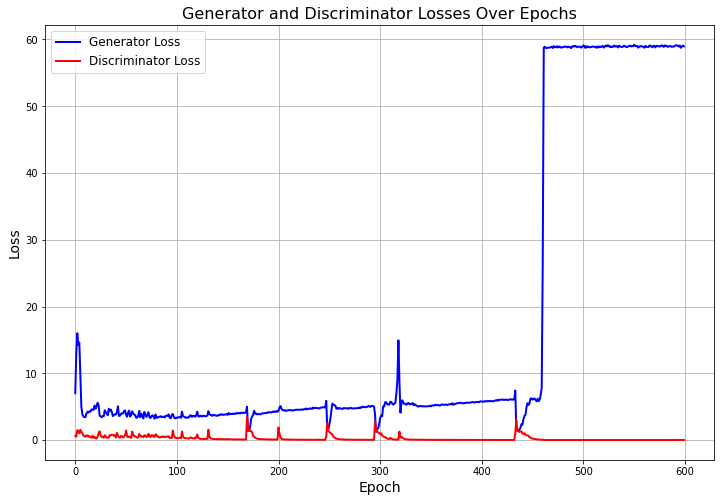

In [23]:
plot_losses(G_losses,D_losses)